In [1]:
%matplotlib inline

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch
import torchvision.transforms as T
from torch.utils.data import DataLoader
from torchmetrics.functional import peak_signal_noise_ratio, structural_similarity_index_measure
from unet_superresolution import UNetSR
from imagenet_torch import ImageNet1000

In [ ]:
# for gitlab lrz:
# git config --global user.email "faidra.patsatzi@tum.de"
# git config --global user.name "faidra.patsatzi"

Number of images in dataset:  34745


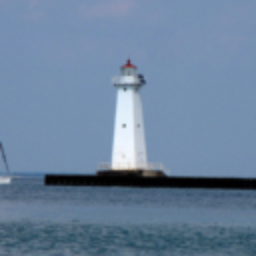

In [4]:
os.chdir('/faidra/project')
dataset = ImageNet1000('./imagenet-mini/train')
low_img, high_img = dataset[10]
print("Number of images in dataset: ", len(dataset))
to_pil = T.ToPILImage()
to_pil(low_img).show()

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchmetrics.functional import peak_signal_noise_ratio, structural_similarity_index_measure
from unet_superresolution import UNetSR
from imagenet_torch import ImageNet1000
from smoothened_estimate import SmoothenedModel

# model_0.pt is for sigma=0.1
# model_025.pt is for sigma==0.25
# all models with _small have an input and output size of 80x80x3
# small_2 are the models which have been trained correctly (no weird colours), 010 has been trained with lr=10e-3
# small_3 are the models which have been trained on pictures directly loaded to size 80x80x3 (centercrop has no effect) - maybe not the right way
# small_4 are like 2 but normalized and without the torch.clip s..
normalize_inverse = transforms.Normalize(mean=[-0.4882/0.2777, -0.4431/0.2665, -0.3946/0.2739],
                             std=[1/0.2777, 1/0.2665, 1/0.2739])
# 0.4882, 0.4431, 0.3946
def tensor_to_imshow(x):
    transform = transforms.ToPILImage()
    x_numpy = np.array(transform(torch.clamp(normalize_inverse(x),0.,1.)))
    return x_numpy

def test(model_name, sigma, smoothened=False):
    
    test_data = ImageNet1000('./imagenet-mini/val', scaling_factor=2, use_cache=True)
    test_dataloader = DataLoader(test_data, batch_size=50, pin_memory=True)
    
    device = 'cuda:1'
    model = torch.load(model_name).to(device)
    smoothing_model = SmoothenedModel(model, sigma, device)
    
    model.eval()
    with torch.no_grad():
        val_psnr = []
        val_ssim = []
        
        sr_imgs = []
        smooth_sr_imgs = []
        lr_imgs = []
        hr_imgs = []
        low_raw_imgs = []
        for idx, (low_img, high_img) in enumerate(test_dataloader):
                low_raw_imgs.append(low_img)
                low_noisy = low_img + torch.randn_like(low_img)*sigma
                #low_noisy = torch.clip(low_noisy, 0., 1.)
                
                lr_imgs.append(low_noisy)
                hr_imgs.append(high_img)
                low_noisy = low_noisy.to(device)
                #low_img = low_img.to(device)
                high_img = high_img.to(device)
                
                output = model(low_noisy)
                #output = model(low_img)
                #output = torch.clip(output, 0., 1.)
                sr_imgs.append(output.detach().cpu())
                
                smooth = smoothing_model(low_noisy, num_e=25)
                smooth_sr_imgs.append(smooth)
                
                if idx==1:
                    break
                psnr = peak_signal_noise_ratio(output.detach().cpu(), high_img.detach().cpu())
                psnr_smooth = peak_signal_noise_ratio(
                    smooth.detach().cpu(), normalize_inverse(high_img).detach().cpu())
                #val_psnr.append(psnr) 
                ssim = structural_similarity_index_measure(output.detach().cpu(), high_img.detach().cpu())
                val_ssim.append(ssim)
                ssim_smooth = structural_similarity_index_measure(
                    smooth.detach().cpu(), normalize_inverse(high_img).detach().cpu())
                print("PSNR:",psnr)
                print("SSIM:",ssim)
                print("PSNR smooth:",psnr_smooth)
                print("SSIM smooth:",ssim_smooth)
            
    fig = plt.figure(figsize=(20,100))
    #fig = plt.figure()
    grid = gridspec.GridSpec(24,5)
    
    for i in range(24):
        ax1 = plt.subplot(grid[i, 0])
        ax1.get_xaxis().set_visible(False)
        ax1.get_yaxis().set_visible(False)
        ax2 = plt.subplot(grid[i, 1])
        ax2.get_xaxis().set_visible(False)
        ax2.get_yaxis().set_visible(False)
        ax3 = plt.subplot(grid[i, 2])
        ax3.get_xaxis().set_visible(False)
        ax3.get_yaxis().set_visible(False)
        ax4 = plt.subplot(grid[i, 3])
        ax4.get_xaxis().set_visible(False)
        ax4.get_yaxis().set_visible(False)
        ax5 = plt.subplot(grid[i, 4])
        ax5.get_xaxis().set_visible(False)
        ax5.get_yaxis().set_visible(False)

        if i == 0:
            ax1.set_title('Low resolution', fontsize=10)
            ax5.set_title(f'Low resolution with noise = {sigma}', fontsize=10)
            ax3.set_title('Super resolution', fontsize=10)
            ax4.set_title('Smoothened SR', fontsize=10)
            ax2.set_title('High resolution', fontsize=10)
        else:
            ax1.set_title('')
            ax2.set_title('')
            ax3.set_title('')
            ax4.set_title('')
            ax5.set_title('')
            
        ax5.imshow(tensor_to_imshow(lr_imgs[0][i]))
        ax1.imshow(tensor_to_imshow(low_raw_imgs[0][i]))
        ax3.imshow(tensor_to_imshow(sr_imgs[0][i]))
        ax4.imshow(np.array(smooth_sr_imgs[0][i].detach().cpu().permute(1,2,0).clip(0.,1.)))
        ax2.imshow(tensor_to_imshow(hr_imgs[0][i]))
        
    plt.show()
    

Loading dataset into cache...
PSNR: tensor(23.8385)
SSIM: tensor(0.7291)
PSNR smooth: tensor(23.1715)
SSIM smooth: tensor(0.7018)


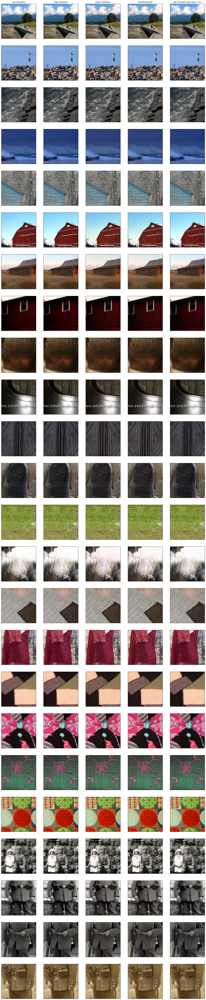

In [7]:
os.chdir('/faidra/project')
test('model_01_50.pt', sigma=0.1)